In [63]:
import os 
import sys
import yaml
import json
from pprint import pprint
from glob import glob
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import cv2
import xml.etree.ElementTree as ET
from svglib.svglib import svg2rlg
from reportlab.graphics import renderPM


import open3d as o3d
import trimesh
import plotly.graph_objects as go
import PIL
from PIL import Image

def view_svg_matplotlib(svg_file_path):
    # Create a new figure with the same dimensions as the SVG
    tree = ET.parse(svg_file_path)
    root = tree.getroot()
    
    # Get viewBox attributes
    viewBox = root.attrib['viewBox'].split()
    x_min, y_min, width, height = map(float, viewBox)
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Set limits according to viewBox
    ax.set_xlim(x_min, x_min + width)
    ax.set_ylim(y_min, y_min + height)
    
    # Plot each path
    for path in root.findall('.//{http://www.w3.org/2000/svg}path'):
        # You could add more sophisticated path parsing here
        ax.plot([], [])  # This is a simplified version
    
    plt.axis('equal')
    plt.show()
    

def view_svg_pil(svg_file_path, output_path="output.png"):
    drawing = svg2rlg(svg_file_path)
    renderPM.drawToFile(drawing, output_path, fmt="PNG")
    img = Image.open(output_path)
    img.show()


def visualize_mesh_plotly(mesh_path):
    # Load the mesh using trimesh
    mesh = trimesh.load(mesh_path)
    
    # Create the 3D scatter plot for vertices
    fig = go.Figure(data=[
        go.Mesh3d(
            x=mesh.vertices[:, 0],
            y=mesh.vertices[:, 1],
            z=mesh.vertices[:, 2],
            i=mesh.faces[:, 0],
            j=mesh.faces[:, 1],
            k=mesh.faces[:, 2],
            opacity=0.8,
            color='lightgray'
        )
    ])
    
    # Update the layout
    fig.update_layout(
        scene=dict(
            aspectmode='data'  # Preserve aspect ratio
        ),
        width=800,
        height=800,
        showlegend=False
    )
    
    # Show the plot
    fig.show()


GARMENT_ROOT_PATH = "/media/hjp/05aba9a7-0e74-4e54-9bc9-5f11b9c4c757/GarmentCodeData/GarmentCodeData_v2/"
MEAN_ALL_BODY_PATH = os.path.join("/media/hjp/05aba9a7-0e74-4e54-9bc9-5f11b9c4c757/GarmentCodeData/", "neutral_body/mean_all.obj")
    

visualize_mesh_plotly(MEAN_ALL_BODY_PATH)

In [7]:
len(glob(os.path.join(GARMENT_ROOT_PATH, "*")))

36

## Visualize Default Body Setting

In [23]:
len(glob(os.path.join(GARMENT_ROOT_PATH, "*", "default_body", "*")))

117469

In [68]:
IDX = 0
garment_path = glob(os.path.join(GARMENT_ROOT_PATH, "*", "default_body", "*"))[IDX]
garment_id = os.path.basename(garment_path)

print(garment_path)
print(garment_id)

os.listdir(garment_path)

/media/hjp/05aba9a7-0e74-4e54-9bc9-5f11b9c4c757/GarmentCodeData/GarmentCodeData_v2/garments_5000_2/default_body/rand_ZAZF3SNHNC
rand_ZAZF3SNHNC


['rand_ZAZF3SNHNC_texture.png',
 'rand_ZAZF3SNHNC_design_params.yaml',
 'rand_ZAZF3SNHNC_render_back.png',
 'rand_ZAZF3SNHNC_boxmesh.ply',
 'rand_ZAZF3SNHNC_specification.json',
 'rand_ZAZF3SNHNC_body_measurements.yaml',
 'rand_ZAZF3SNHNC_pattern.svg',
 'rand_ZAZF3SNHNC_vertex_labels.yaml',
 'rand_ZAZF3SNHNC_sim.ply',
 'rand_ZAZF3SNHNC_orig_lens.pickle',
 'rand_ZAZF3SNHNC_sim_segmentation.txt',
 'rand_ZAZF3SNHNC_render_front.png',
 'rand_ZAZF3SNHNC_pattern.png']

In [53]:
with open(os.path.join(garment_path, f"{garment_id}_orig_lens.pickle"), "rb") as f:
    orig_lens = pickle.load(f)

len(orig_lens)

1728

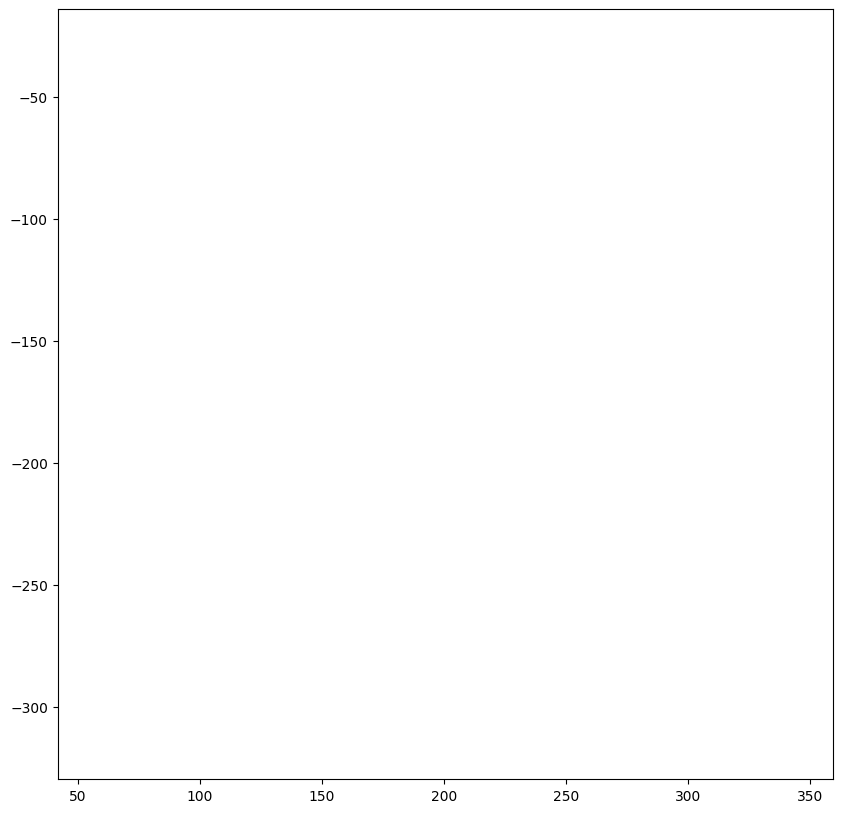

In [65]:
view_svg_matplotlib(os.path.join(garment_path, f"{garment_id}_pattern.svg"))

In [48]:
with open(os.path.join(garment_path, f"{garment_id}_sim_segmentation.txt"), "r") as f:
    segmentation = f.readlines()

len(",".join(segmentation).split(","))

18559

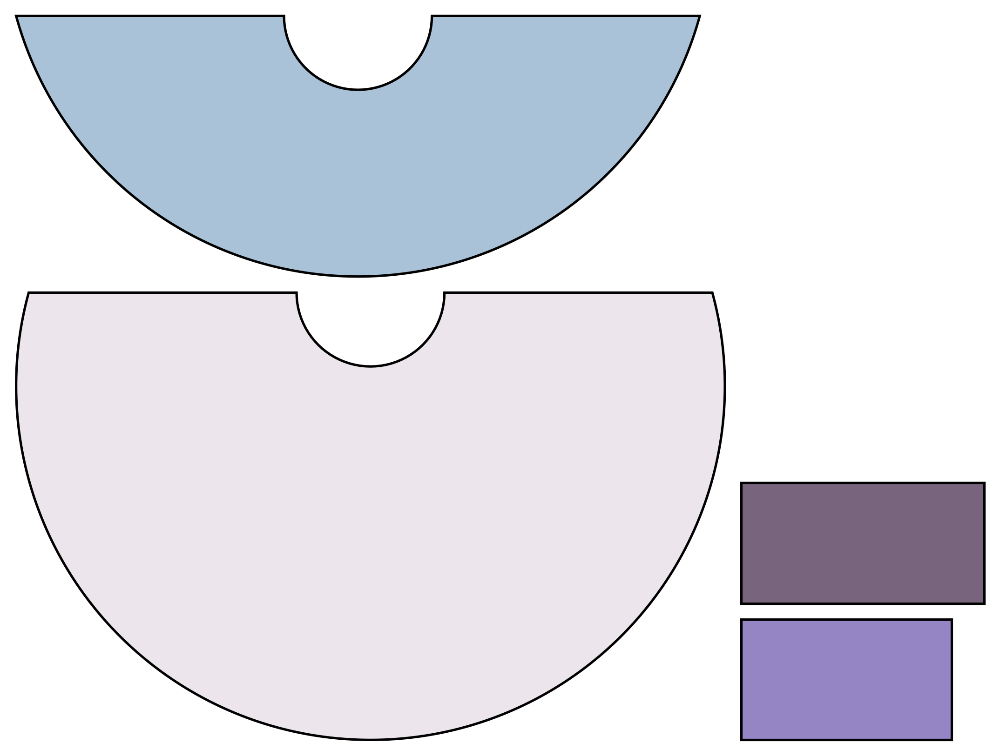

In [54]:
PIL.Image.open(os.path.join(garment_path, f"{garment_id}_texture.png"))

In [39]:
mesh = trimesh.load(os.path.join(garment_path,  f"{garment_id}_sim.ply"))
print(len(mesh.vertices))

visualize_mesh_plotly(
    os.path.join(garment_path,  f"{garment_id}_sim.ply")
)

18795


In [49]:
box_mesh = trimesh.load(os.path.join(garment_path,  f"{garment_id}_boxmesh.ply")) 

print(len(box_mesh.vertices))

visualize_mesh_plotly(
    os.path.join(garment_path,  f"{garment_id}_boxmesh.ply")
)

18795


## Visualize Random Body Setting

In [89]:
IDX = 0
garment_path = sorted(
    list(filter(
        os.path.isdir,
        glob(os.path.join(GARMENT_ROOT_PATH, "*", "random_body", "*"))
    ))
)[IDX]
garment_id = os.path.basename(garment_path)

print(garment_path)
print(garment_id)

sorted(os.listdir(garment_path))

/media/hjp/05aba9a7-0e74-4e54-9bc9-5f11b9c4c757/GarmentCodeData/GarmentCodeData_v2/garments_5000_0/random_body/rand_023FMIGQK0
rand_023FMIGQK0


['rand_023FMIGQK0_body_measurements.yaml',
 'rand_023FMIGQK0_boxmesh.ply',
 'rand_023FMIGQK0_design_params.yaml',
 'rand_023FMIGQK0_orig_lens.pickle',
 'rand_023FMIGQK0_pattern.png',
 'rand_023FMIGQK0_pattern.svg',
 'rand_023FMIGQK0_render_back.png',
 'rand_023FMIGQK0_render_front.png',
 'rand_023FMIGQK0_sim.ply',
 'rand_023FMIGQK0_sim_segmentation.txt',
 'rand_023FMIGQK0_specification.json',
 'rand_023FMIGQK0_texture.png',
 'rand_023FMIGQK0_vertex_labels.yaml']

In [90]:
body_measurement = yaml.load(open(os.path.join(garment_path, f"{garment_id}_body_measurements.yaml"), "r"), Loader=yaml.FullLoader)

boxmesh = trimesh.load(os.path.join(garment_path, f"{garment_id}_boxmesh.ply"))

design_params = yaml.load(open(os.path.join(garment_path, f"{garment_id}_design_params.yaml"), "r"), Loader=yaml.FullLoader)

orig_lens = pickle.load(open(os.path.join(garment_path, f"{garment_id}_orig_lens.pickle"), "rb"))

pattern = PIL.Image.open(os.path.join(garment_path, f"{garment_id}_pattern.png"))

render_back = PIL.Image.open(os.path.join(garment_path, f"{garment_id}_render_back.png"))

render_front = PIL.Image.open(os.path.join(garment_path, f"{garment_id}_render_front.png"))

sim_mesh = trimesh.load(os.path.join(garment_path, f"{garment_id}_sim.ply"))

with open(os.path.join(garment_path, f"{garment_id}_sim_segmentation.txt"), "r") as f:
    sim_segmentation = f.readlines()

specification = json.load(open(os.path.join(garment_path, f"{garment_id}_specification.json"), "r"))

texture = PIL.Image.open(os.path.join(garment_path, f"{garment_id}_texture.png"))

vertex_labels = yaml.load(open(os.path.join(garment_path, f"{garment_id}_vertex_labels.yaml"), "r"), Loader=yaml.FullLoader)

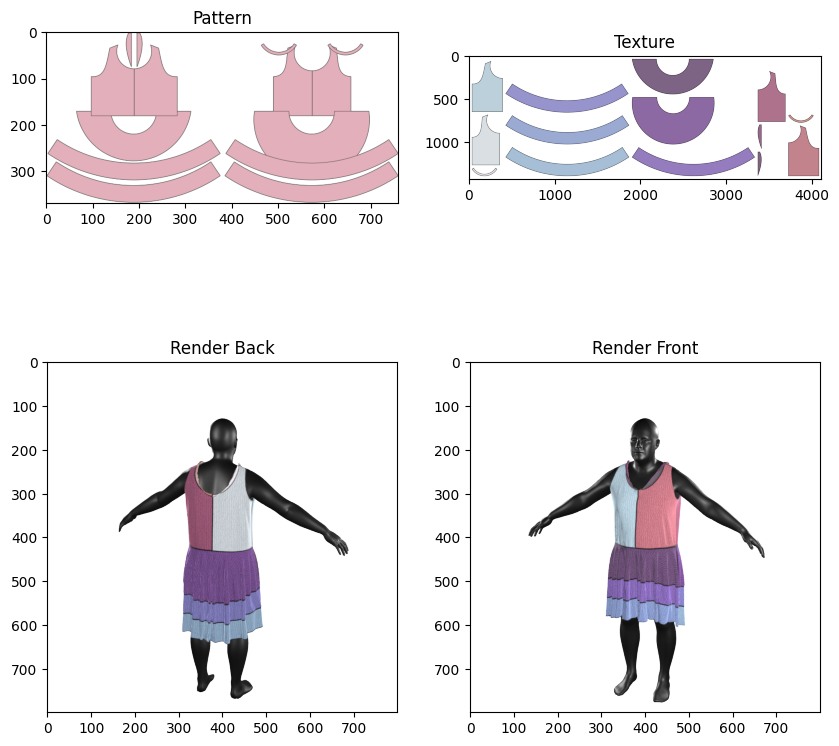

In [91]:
plt.figure(figsize=(10, 10))
plt.subplot(2, 2, 1)
plt.title("Pattern")
plt.imshow(pattern)
plt.subplot(2, 2, 2)
plt.title("Texture")
plt.imshow(texture)
plt.subplot(2, 2, 3)
plt.title("Render Back")
plt.imshow(render_back)
plt.subplot(2, 2, 4)
plt.title("Render Front")
plt.imshow(render_front)